# Check CUDA configs


In [1]:
import ultralytics
import torch

# %export CUDA_VISIBLE_DEVICES=""

# torch.cuda.is_available()
# torch.cuda.set_device(0)

In [2]:
# check cuda configurations
print(torch.version.cuda)
# torch.cpu()
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.get_device_name(0))

12.1
True
0
NVIDIA GeForce RTX 4070 Laptop GPU


In [3]:
ultralytics.checks()
!nvidia-smi

Ultralytics YOLOv8.0.175  Python-3.11.5 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Setup complete  (32 CPUs, 15.7 GB RAM, 280.1/634.8 GB disk)


Fri Oct 27 23:11:07 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 537.34                 Driver Version: 537.34       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4070 ...  WDDM  | 00000000:01:00.0  On |                  N/A |
| N/A   40C    P0              12W / 140W |    492MiB /  8188MiB |      3%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# MODEL TRAINING


In [2]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
import cv2

In [5]:
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

data = os.getcwd() + "/datasets/EE297_Project.v4i.yolov8/data.yaml"
epochs = 10
imgsz = 640
batch = 16
device = 0

results = model.train(
    data=data, epochs=epochs, imgsz=imgsz, batch=16, device="cpu", workers=1
)

New https://pypi.org/project/ultralytics/8.0.202 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.175  Python-3.11.5 torch-2.1.0+cu121 CPU (13th Gen Intel Core(TM) i9-13900HX)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=d:\Programming\workspace\plastic-detection/datasets/EE297_Project.v4i.yolov8/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=1, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, str

# MODEL COMPARISON


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

pretrained (default)


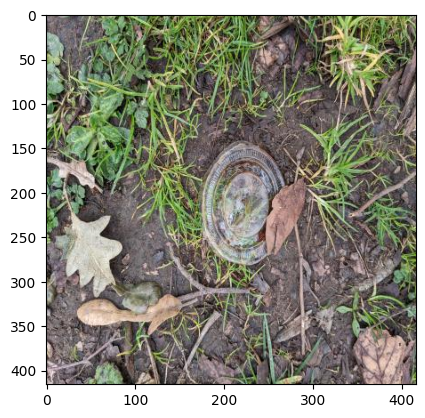


0: 640x640 (no detections), 5.5ms
Speed: 1.0ms preprocess, 5.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


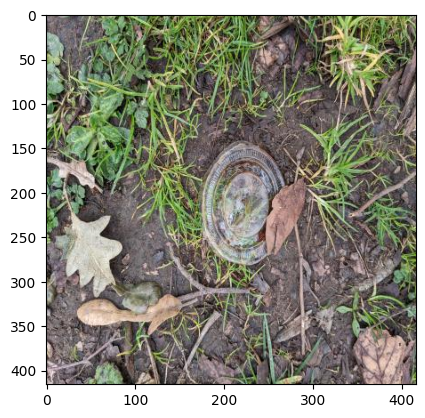

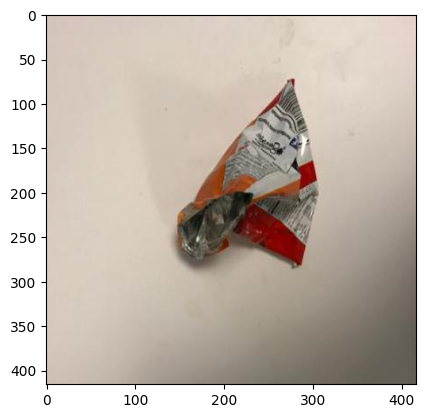


0: 640x640 1 kite, 5.0ms
Speed: 3.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


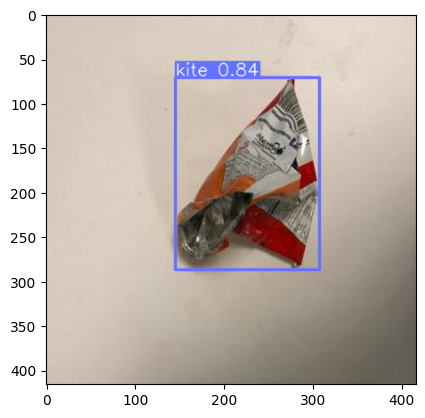

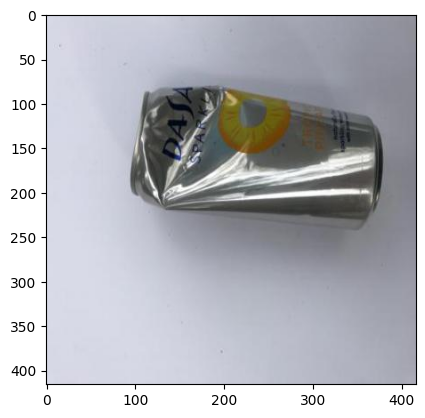


0: 640x640 1 kite, 5.0ms
Speed: 2.0ms preprocess, 5.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


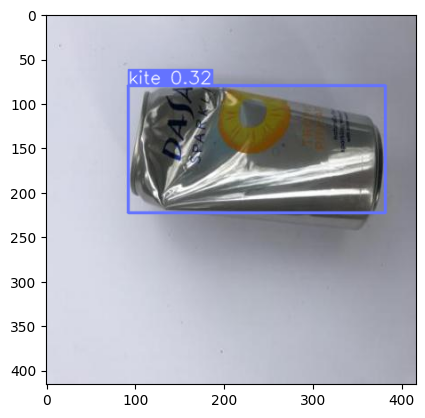

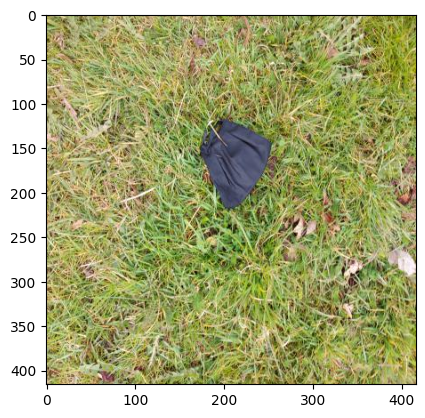


0: 640x640 1 handbag, 4.5ms
Speed: 3.0ms preprocess, 4.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


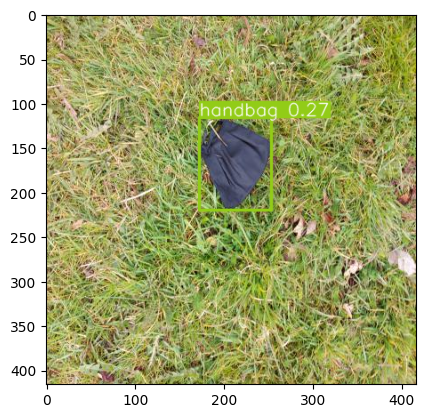

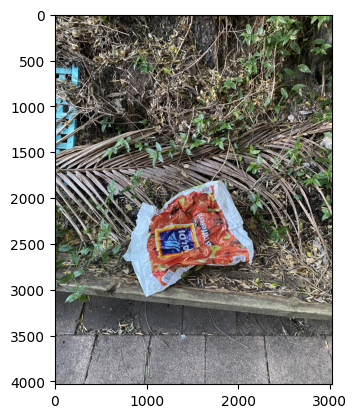


0: 640x480 1 umbrella, 5.5ms
Speed: 2.0ms preprocess, 5.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


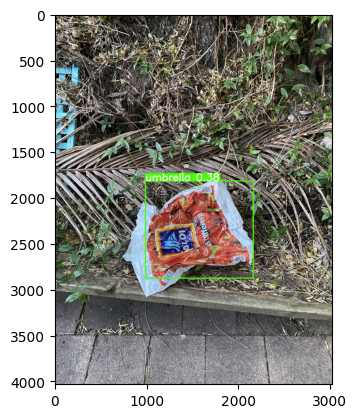

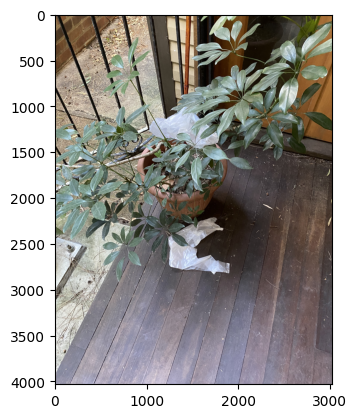


0: 640x480 (no detections), 16.6ms
Speed: 2.1ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


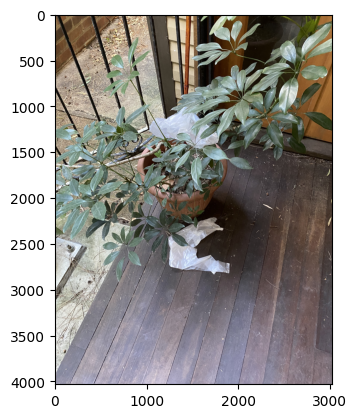

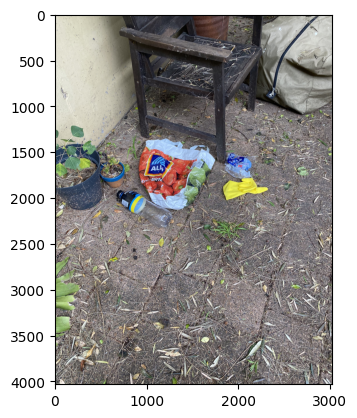


0: 640x480 1 bench, 1 bottle, 1 potted plant, 11.8ms
Speed: 2.0ms preprocess, 11.8ms inference, 6.4ms postprocess per image at shape (1, 3, 640, 480)


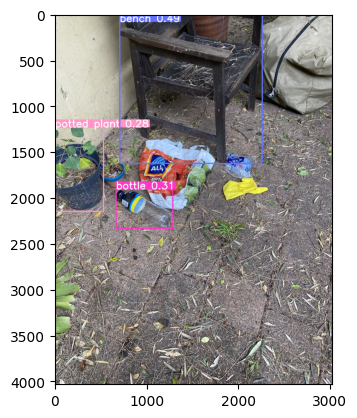

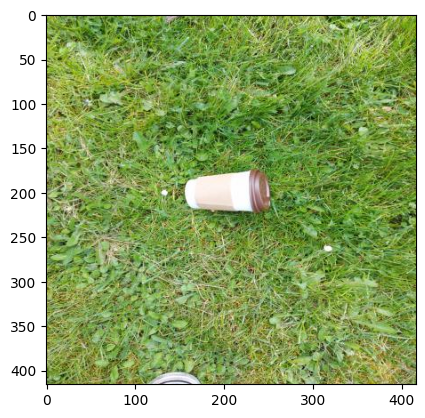


0: 640x640 1 person, 17.0ms
Speed: 3.0ms preprocess, 17.0ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)


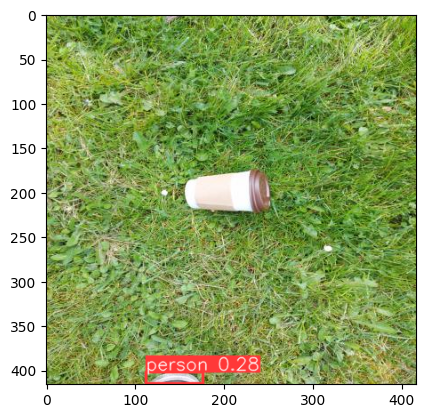

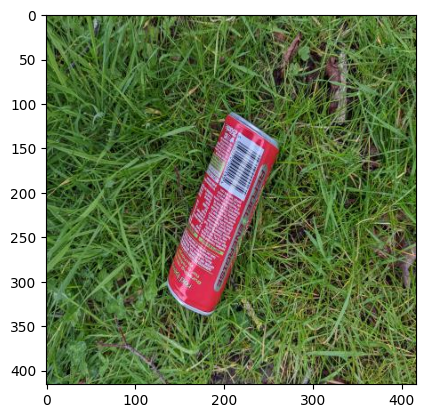


0: 640x640 (no detections), 18.5ms
Speed: 3.0ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


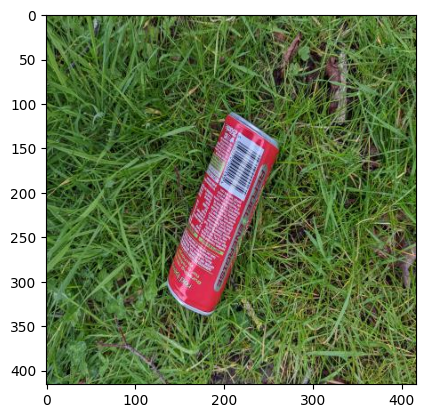

In [14]:
def test_model(model):
    test_imgs = [
        "/datasets/EE297_Project.v4i.yolov8/test/images/PXL_20220330_091951914_jpg.rf.2be1c42071953a90ce2781c2d0d18d8c.jpg",
        "/datasets/EE297_Project.v4i.yolov8/test/images/trash83_jpg.rf.aa417b0b095f4babf254cda7c56710d7.JPG",
        "/datasets/EE297_Project.v4i.yolov8/test/images/metal242_jpg.rf.9e181d3e1d9b561a79e4fd0a8d747a2e.jpg",
        "/datasets/EE297_Project.v4i.yolov8/test/images/20220406_110922_jpg.rf.e08d550fbc12079e7723725ebc7223ce.jpg",
        "/datasets/classification_dataset/images/IMG_0961.jpeg",
        "/datasets/classification_dataset/images/IMG_0975.jpeg",
        "/datasets/classification_dataset/images/IMG_1414.jpeg",
        "/datasets/EE297_Project.v4i.yolov8/test/images/20220406_111424_jpg.rf.412e398d3763d5c122b86b0d3f07e505.jpg",
        "/datasets/EE297_Project.v4i.yolov8/test/images/PXL_20220330_090752236_jpg.rf.1191ca3a67a9f20d7629428a0cc4b43e.jpg",
    ]

    for img_path in test_imgs:
        img = cv2.imread(os.getcwd() + img_path)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()

        results = model.predict(img)
        plt.imshow(cv2.cvtColor(results[0].plot(), cv2.COLOR_BGR2RGB))
        plt.show()


model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)
test_model(model)

test trained model


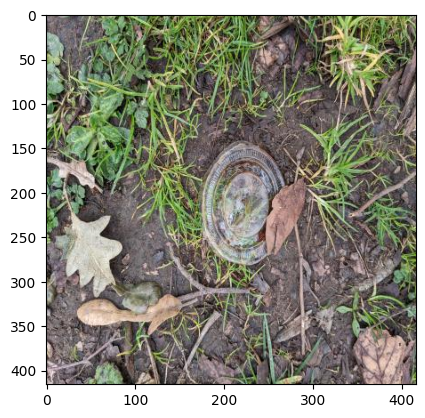


0: 640x640 1 Plastic, 16.1ms
Speed: 3.9ms preprocess, 16.1ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


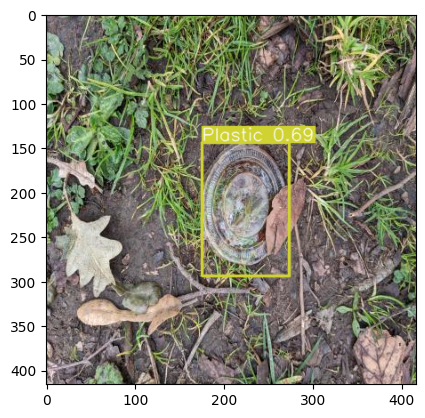

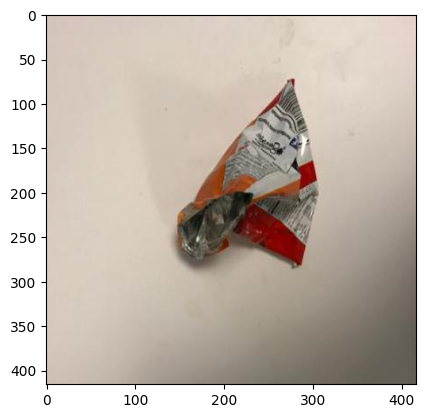


0: 640x640 1 Plastic, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)


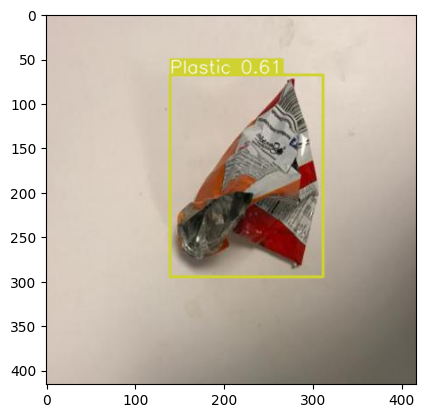

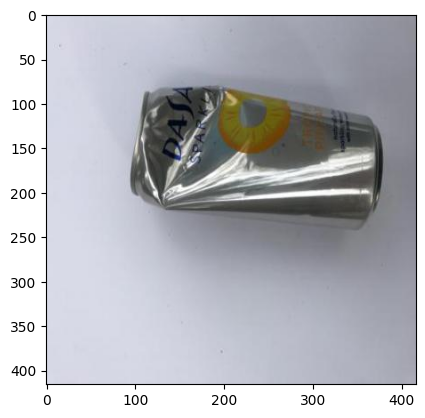


0: 640x640 1 Metal, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


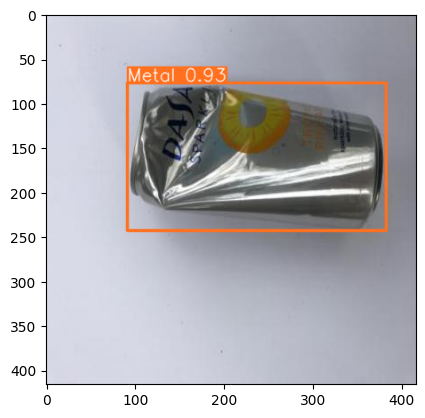

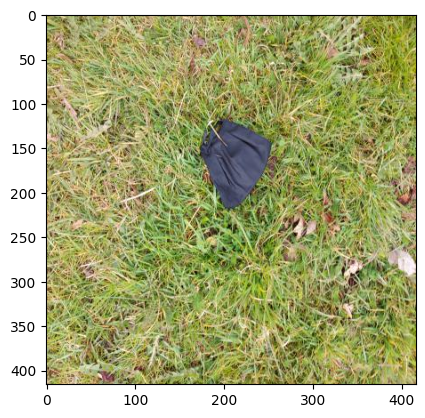


0: 640x640 1 Plastic, 18.8ms
Speed: 3.0ms preprocess, 18.8ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


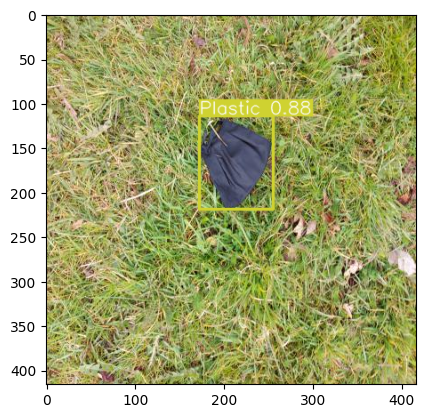

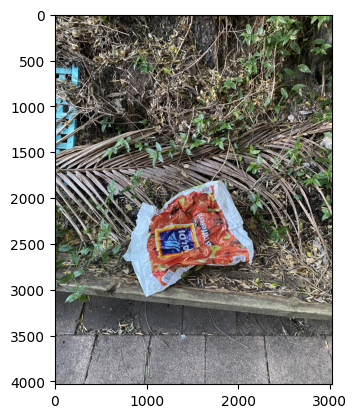


0: 640x480 4 Plastics, 18.1ms
Speed: 2.0ms preprocess, 18.1ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 480)


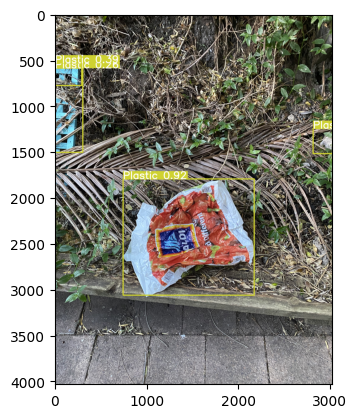

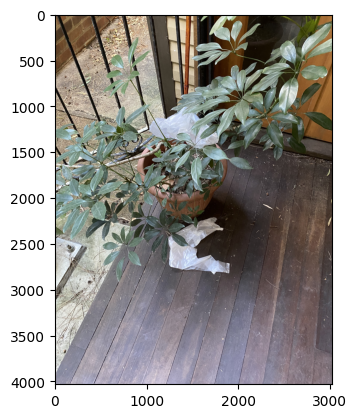


0: 640x480 2 Plastics, 11.2ms
Speed: 4.1ms preprocess, 11.2ms inference, 6.1ms postprocess per image at shape (1, 3, 640, 480)


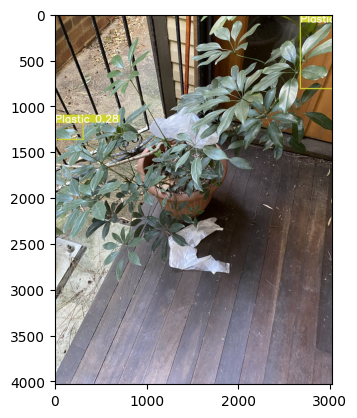

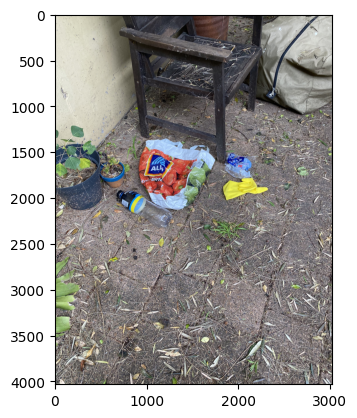


0: 640x480 1 Metal, 4 Plastics, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


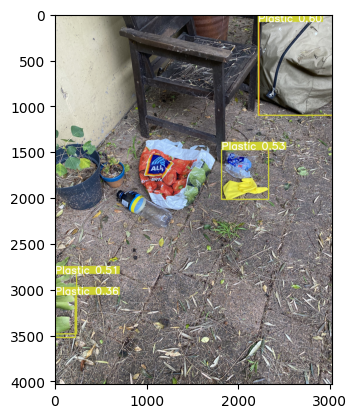

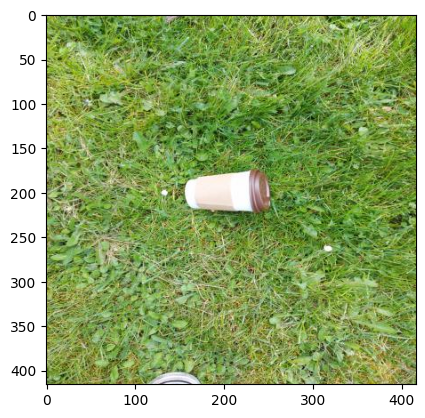


0: 640x640 1 Paper, 1 Plastic, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


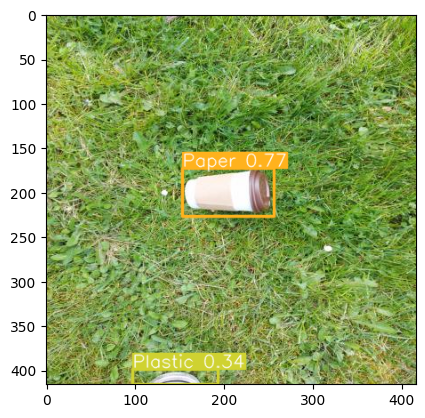

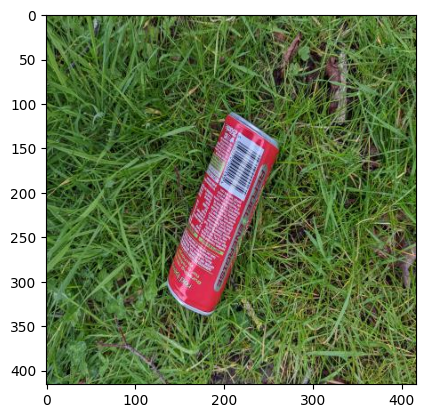


0: 640x640 2 Plastics, 20.6ms
Speed: 4.0ms preprocess, 20.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


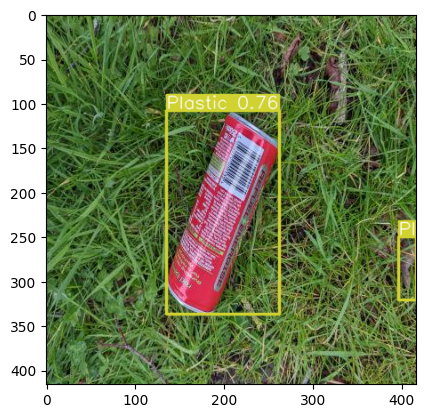

In [15]:
model_path = "runs/detect/train/weights/best.pt"
# trained_model = YOLO("yolov8n.yaml").load(model_path)
trained_model = YOLO(model_path)
test_model(trained_model)